In [28]:
ckpt_path = "/home/qygao/matten/scripts/wandb_logs/matten_dielectric_tensor/s97m3vmq/checkpoints/epoch=55-step=20384.ckpt"
test_json = "/home/qygao/matten/datasets/dielectric_tensor_test_symmetric.json"

In [1]:
import json, numpy as np, pandas as pd

test_json = "/home/qygao/matten/datasets/dielectric_tensor_test_symmetric.json"
d = json.load(open(test_json, "r"))
eps = d["dielectric_tensor"]  # dict[id] -> 3x3

def sym(A):
    A = np.array(A, float)
    return 0.5*(A + A.T)

rows = []
for sid, A in eps.items():
    A = sym(A)
    w = np.linalg.eigvalsh(A)   #升序
    off = A - np.diag(np.diag(A))
    off_ratio = np.linalg.norm(off) / (np.linalg.norm(A) + 1e-12)
    rows.append({
        "id": str(sid),
        "trace_div3": np.trace(A)/3.0,
        "lam_min": w[0],
        "lam_mid": w[1],
        "lam_max": w[2],
        "anis_ratio": w[2]/(w[0] + 1e-12),          # 另一种常用各向异性比
        "offdiag_norm_ratio": off_ratio,
        "is_pd": int(w[0] > 0),
        "split": d.get("split", {}).get(str(sid), None),
        "crystal_system": d.get("crystal_system", {}).get(str(sid), None),
    })

df = pd.DataFrame(rows).set_index("id")
df.head()


,trace_div3,lam_min,lam_mid,lam_max,anis_ratio,offdiag_norm_ratio,is_pd,split,crystal_system
id,,,,,,,,,
6059,18.601699,3.657946,22.342874,29.804278,8.147818,0.000000e+00,1,test,orthorhombic
6010,8.468872,7.573223,8.066462,9.766931,1.289666,9.293018e-02,1,test,triclinic
4475,10.430094,9.206336,9.873941,12.210006,1.326261,1.149152e-01,1,test,monoclinic
3689,7.897992,7.644930,7.644933,8.404112,1.099305,1.375367e-23,1,test,hexagonal
4515,7.533692,7.247512,7.247512,8.106052,1.118460,9.166870e-23,1,test,tetragonal


In [2]:
import torch
import numpy as np
import pandas as pd

from matten.dataset.structure_scalar_tensor import TensorDataModule
from matten.model_factory.tfn_scalar_tensor import ScalarTensorModel


/home/qygao/.conda/envs/matten/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/qygao/.conda/envs/matten/lib/python3.10/site-packages/torchmetrics/utilities/imports.py:22: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [8]:
import json

with open(test_json, "r") as f:
    data = json.load(f)

print(data.keys())
print(json.dumps(data, indent=2))

dict_keys(['structure', 'formula_pretty', 'crystal_system', 'dielectric_tensor', 'dielectric_tensor_voigt', 'split'])
{
  "structure": {
    "6059": {
      "@module": "pymatgen.core.structure",
      "@class": "Structure",
      "charge": 0,
      "lattice": {
        "matrix": [
          [
            3.874579,
            0.0,
            0.0
          ],
          [
            0.0,
            7.724346,
            0.0
          ],
          [
            0.0,
            0.0,
            8.322164
          ]
        ],
        "pbc": [
          true,
          true,
          true
        ],
        "a": 3.874579,
        "b": 7.724346,
        "c": 8.322164,
        "alpha": 90.0,
        "beta": 90.0,
        "gamma": 90.0,
        "volume": 249.0706242849
      },
      "properties": {},
      "sites": [
        {
          "species": [
            {
              "element": "W",
              "occu": 1
            }
          ],
          "abc": [
            0.52883,
     

In [23]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

out_dir  = "/home/qygao/matten/datasets/dielectric_tensor_distribution"   # 例如: "/home/qygao/outputs/dielectric_dist"

os.makedirs(out_dir, exist_ok=True)

with open(test_json, "r", encoding="utf-8") as f:
    data = json.load(f)

def is_tensor_like(x):
    if isinstance(x, (list, tuple, np.ndarray)):
        a = np.asarray(x, dtype=float)
        return a.shape == (3, 3) or a.size in (6, 9)
    return False

def voigt6_to_3x3(v):
    v = np.asarray(v, dtype=float).reshape(6,)
    xx, yy, zz, yz, xz, xy = v.tolist()
    return np.array([[xx, xy, xz],
                     [xy, yy, yz],
                     [xz, yz, zz]], dtype=float)

def to_3x3(t):
    a = np.asarray(t, dtype=float)
    if a.shape == (3, 3): return a
    if a.size == 9: return a.reshape(3, 3)
    if a.size == 6: return voigt6_to_3x3(a.reshape(6,))
    raise ValueError(f"Unsupported tensor: shape={a.shape}, size={a.size}")

def get_id_tensor_items(key_name):
    obj = data.get(key_name, None)
    if obj is None:
        return None
    if is_tensor_like(obj):
        return [("single", obj)]
    if isinstance(obj, list):
        return [(str(i), obj[i]) for i in range(len(obj))]
    if isinstance(obj, dict):
        return list(obj.items())
    raise TypeError(f"{key_name} unsupported type: {type(obj)}")

items = get_id_tensor_items("dielectric_tensor")
src = "dielectric_tensor"
if items is None:
    items = get_id_tensor_items("dielectric_tensor_voigt")
    src = "dielectric_tensor_voigt"
if items is None:
    raise KeyError("json 里没找到 dielectric_tensor / dielectric_tensor_voigt")

ids, tensors = [], []
bad = 0
for sid, t in items:
    try:
        A = to_3x3(t)
        ids.append(str(sid))
        tensors.append(A)
    except Exception:
        bad += 1

if len(tensors) == 0:
    raise RuntimeError(f"没能从 {src} 解析出任何 3x3 张量（bad={bad}）")

T = np.stack(tensors, 0)
N = T.shape[0]
print(f"Loaded from {src}: N={N}, bad={bad}")

sym = 0.5 * (T + np.transpose(T, (0, 2, 1)))
asym_err = np.max(np.abs(T - np.transpose(T, (0, 2, 1))), axis=(1, 2))

eig = np.linalg.eigvalsh(sym)
lam1, lam2, lam3 = eig[:, 0], eig[:, 1], eig[:, 2]
trace = np.trace(sym, axis1=1, axis2=2)
mean_lam = trace / 3.0
anis = (lam3 - lam1) / (np.abs(mean_lam) + 1e-12)
is_pd = (lam1 > 0).astype(int)

df = pd.DataFrame({
    "id": ids,
    "xx": sym[:,0,0], "yy": sym[:,1,1], "zz": sym[:,2,2],
    "xy": sym[:,0,1], "xz": sym[:,0,2], "yz": sym[:,1,2],
    "trace": trace,
    "lam1": lam1, "lam2": lam2, "lam3": lam3,
    "anis": anis,
    "asym_err": asym_err,
    "is_pd": is_pd,
}).set_index("id")

if isinstance(data.get("split", None), dict):
    split_s = pd.Series({str(k): v for k, v in data["split"].items()}, name="split")
    df = df.join(split_s, how="left")

# 1) 保存统计表
csv_path = os.path.join(out_dir, f"{src}_stats.csv")
df.to_csv(csv_path)

# 2) 保存 summary 文本
summary_path = os.path.join(out_dir, "summary.txt")
with open(summary_path, "w", encoding="utf-8") as f:
    f.write(f"Source: {src}\n")
    f.write(f"N={N}, bad={bad}\n")
    f.write(f"PD_ratio(min_eig>0)={df['is_pd'].mean():.6f}\n")
    f.write(f"Asym_err median/max = {np.median(df['asym_err']):.6e} / {np.max(df['asym_err']):.6e}\n\n")
    f.write(df.describe(percentiles=[0.01,0.05,0.5,0.95,0.99]).to_string())
    f.write("\n")

# 3) 保存所有直方图 PNG
def save_hist(col, bins=60):
    plt.figure()
    plt.hist(df[col].values, bins=bins)
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel("count")
    plt.tight_layout()
    fig_path = os.path.join(out_dir, f"hist_{col}.png")
    plt.savefig(fig_path, dpi=200)
    plt.close()

for c in ["xx","yy","zz","xy","xz","yz","lam1","lam2","lam3","trace","anis","asym_err"]:
    save_hist(c)

print("Saved to folder:", out_dir)
print(" -", csv_path)
print(" -", summary_path)


Loaded from dielectric_tensor: N=727, bad=0
Saved to folder: /home/qygao/matten/datasets/dielectric_tensor_distribution
 - /home/qygao/matten/datasets/dielectric_tensor_distribution/dielectric_tensor_stats.csv
 - /home/qygao/matten/datasets/dielectric_tensor_distribution/summary.txt


In [24]:
import numpy as np

def topk(df, col, k=20, key_abs=False):
    s = df[col].abs() if key_abs else df[col]
    return df.loc[s.sort_values(ascending=False).head(k).index, [col, "xx","yy","zz","xy","xz","yz","trace","lam1","lam2","lam3","anis"]]

print("\n=== Top trace ===")
print(topk(df, "trace", 20))

print("\n=== Top lam3 ===")
print(topk(df, "lam3", 20))

print("\n=== Top |xz| ===")
print(topk(df, "xz", 20, key_abs=True))

print("\n=== Top anis ===")
print(topk(df, "anis", 20))



=== Top trace ===
            trace           xx           yy           zz            xy  \
id                                                                       
5717  4503.221113  2244.319163  2244.319742    14.582207  2.807051e-04   
1426  2945.009989  1469.871830  1469.871830     5.266329  0.000000e+00   
4483  1792.072210    37.167213    37.167213  1717.737784  0.000000e+00   
393    949.645295    19.217774    20.192939   910.234581  0.000000e+00   
2851   801.828152   267.276051   267.276051   267.276051  0.000000e+00   
4560   669.238745   223.079582   223.079582   223.079582  0.000000e+00   
2063   636.368819    36.149559    36.149562   564.069698  5.677000e-07   
2275   534.012191   178.004064   178.004064   178.004064  0.000000e+00   
5021   472.360357   106.030541   106.030541   260.299276  0.000000e+00   
2436   461.572101   116.778337   116.778337   228.015428  0.000000e+00   
2549   447.492470   206.737413   206.737471    34.017586  0.000000e+00   
535    428.002640  

In [25]:
import os, json
import numpy as np
import pandas as pd

os.makedirs(out_dir, exist_ok=True)

with open(test_json, "r", encoding="utf-8") as f:
    data = json.load(f)

eps = data["dielectric_tensor"]          # 你的结构：dict[id] -> 3x3
formula = data.get("formula_pretty", {}) # 可能是 dict[id]->str 或单个 str
crys = data.get("crystal_system", {})
split = data.get("split", {})

def safe_get(obj, k):
    if isinstance(obj, dict):
        return obj.get(str(k), obj.get(int(k), None))
    return obj

def inspect_id(sid):
    A = np.array(eps[str(sid)] if str(sid) in eps else eps[int(sid)], dtype=float)
    A_sym = 0.5*(A + A.T)

    w, V = np.linalg.eigh(A_sym)     # A = V diag(w) V^T
    A_rot = V.T @ A_sym @ V          # 主轴系：应接近对角

    offdiag = A_sym - np.diag(np.diag(A_sym))
    off_ratio = np.linalg.norm(offdiag) / (np.linalg.norm(A_sym) + 1e-12)

    rec = {
        "id": str(sid),
        "formula": safe_get(formula, sid),
        "crystal_system": safe_get(crys, sid),
        "split": safe_get(split, sid),
        "A": A_sym.tolist(),
        "eigvals(lam1<=lam2<=lam3)": w.tolist(),
        "offdiag_norm_ratio": float(off_ratio),
        "A_rot_principal_axes": A_rot.tolist(),
        "eigvecs(columns)": V.tolist(),
    }
    return rec

# 你关心的几个 id（把你打印出来的 top id 粘进来就行）
ids_to_check = [
    5717,1426,4483,393,2851,4560,2063,1103,3944,6450,3095,5783,543
]

reports = []
for sid in ids_to_check:
    rep = inspect_id(sid)
    reports.append(rep)

# 保存一个总表（便于你排序筛选）
df_rep = pd.DataFrame([{
    "id": r["id"],
    "formula": r["formula"],
    "crystal_system": r["crystal_system"],
    "split": r["split"],
    "lam1": r["eigvals(lam1<=lam2<=lam3)"][0],
    "lam2": r["eigvals(lam1<=lam2<=lam3)"][1],
    "lam3": r["eigvals(lam1<=lam2<=lam3)"][2],
    "offdiag_norm_ratio": r["offdiag_norm_ratio"],
} for r in reports]).set_index("id")

df_rep.to_csv(os.path.join(out_dir, "outlier_summary.csv"))

# 每个 id 一个详细 json（里面有 A、eig、主轴旋转结果）
for r in reports:
    with open(os.path.join(out_dir, f"id_{r['id']}_report.json"), "w", encoding="utf-8") as f:
        json.dump(r, f, indent=2)

print("saved to:", out_dir)
print(df_rep.sort_values("lam3", ascending=False))


saved to: /home/qygao/matten/datasets/dielectric_tensor_distribution
           formula crystal_system split        lam1         lam2         lam3  \
id                                                                              
5717        TaAgO3       trigonal  test   14.582207  2244.319050  2244.319856   
4483      Sm2CdSe4     tetragonal  test   37.167213    37.167213  1717.737784   
1426         ScClO     tetragonal  test    5.266329  1469.871830  1469.871830   
393        Ca2SnN2   orthorhombic  test   19.217774    20.192939   910.234581   
2063       GaCuSe2     tetragonal  test   36.149559    36.149562   564.069698   
2851       Ca2SnHg          cubic  test  267.276051   267.276051   267.276051   
1103  TiNbTl(O2F)2     monoclinic  test   34.580632    59.155551   244.690354   
3944   Ag5Hg4P8Cl5     monoclinic  test   19.600405    22.185586   241.429657   
4560       Hf2ReIr          cubic  test  223.079582   223.079582   223.079582   
6450       Mg2NbN3     monoclinic  test 

In [26]:
import os, json
import numpy as np
import pandas as pd
os.makedirs(out_dir, exist_ok=True)

with open(test_json, "r", encoding="utf-8") as f:
    data = json.load(f)

eps = data["dielectric_tensor"]          # 你的结构：dict[id] -> 3x3
formula = data.get("formula_pretty", {}) # 可能是 dict[id]->str 或单个 str
crys = data.get("crystal_system", {})
split = data.get("split", {})

def safe_get(obj, k):
    if isinstance(obj, dict):
        return obj.get(str(k), obj.get(int(k), None))
    return obj

def inspect_id(sid):
    A = np.array(eps[str(sid)] if str(sid) in eps else eps[int(sid)], dtype=float)
    A_sym = 0.5*(A + A.T)

    w, V = np.linalg.eigh(A_sym)     # A = V diag(w) V^T
    A_rot = V.T @ A_sym @ V          # 主轴系：应接近对角

    offdiag = A_sym - np.diag(np.diag(A_sym))
    off_ratio = np.linalg.norm(offdiag) / (np.linalg.norm(A_sym) + 1e-12)

    rec = {
        "id": str(sid),
        "formula": safe_get(formula, sid),
        "crystal_system": safe_get(crys, sid),
        "split": safe_get(split, sid),
        "A": A_sym.tolist(),
        "eigvals(lam1<=lam2<=lam3)": w.tolist(),
        "offdiag_norm_ratio": float(off_ratio),
        "A_rot_principal_axes": A_rot.tolist(),
        "eigvecs(columns)": V.tolist(),
    }
    return rec

# 你关心的几个 id（把你打印出来的 top id 粘进来就行）
ids_to_check = [
    5717,1426,4483,393,2851,4560,2063,1103,3944,6450,3095,5783,543
]

reports = []
for sid in ids_to_check:
    rep = inspect_id(sid)
    reports.append(rep)

# 保存一个总表（便于你排序筛选）
df_rep = pd.DataFrame([{
    "id": r["id"],
    "formula": r["formula"],
    "crystal_system": r["crystal_system"],
    "split": r["split"],
    "lam1": r["eigvals(lam1<=lam2<=lam3)"][0],
    "lam2": r["eigvals(lam1<=lam2<=lam3)"][1],
    "lam3": r["eigvals(lam1<=lam2<=lam3)"][2],
    "offdiag_norm_ratio": r["offdiag_norm_ratio"],
} for r in reports]).set_index("id")

df_rep.to_csv(os.path.join(out_dir, "outlier_summary.csv"))

# 每个 id 一个详细 json（里面有 A、eig、主轴旋转结果）
for r in reports:
    with open(os.path.join(out_dir, f"id_{r['id']}_report.json"), "w", encoding="utf-8") as f:
        json.dump(r, f, indent=2)

print("saved to:", out_dir)
print(df_rep.sort_values("lam3", ascending=False))


saved to: /home/qygao/matten/datasets/dielectric_tensor_distribution
           formula crystal_system split        lam1         lam2         lam3  \
id                                                                              
5717        TaAgO3       trigonal  test   14.582207  2244.319050  2244.319856   
4483      Sm2CdSe4     tetragonal  test   37.167213    37.167213  1717.737784   
1426         ScClO     tetragonal  test    5.266329  1469.871830  1469.871830   
393        Ca2SnN2   orthorhombic  test   19.217774    20.192939   910.234581   
2063       GaCuSe2     tetragonal  test   36.149559    36.149562   564.069698   
2851       Ca2SnHg          cubic  test  267.276051   267.276051   267.276051   
1103  TiNbTl(O2F)2     monoclinic  test   34.580632    59.155551   244.690354   
3944   Ag5Hg4P8Cl5     monoclinic  test   19.600405    22.185586   241.429657   
4560       Hf2ReIr          cubic  test  223.079582   223.079582   223.079582   
6450       Mg2NbN3     monoclinic  test 

offdiag_ratio percentiles:
0.00    0.000000e+00
0.50    6.925205e-08
0.90    1.002216e-01
0.95    1.711175e-01
0.99    3.744511e-01
1.00    5.856111e-01
Name: offdiag_norm_ratio, dtype: float64


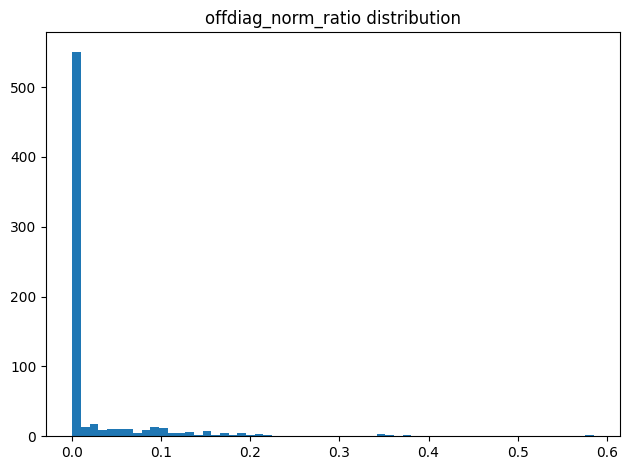

                count          mean           std  min           25%  \
crystal_system                                                         
triclinic        62.0  1.017105e-01  1.191576e-01  0.0  2.754837e-03   
monoclinic      165.0  8.772863e-02  1.107768e-01  0.0  1.407636e-02   
orthorhombic    187.0  1.693943e-03  1.729034e-02  0.0  0.000000e+00   
trigonal         90.0  1.968406e-04  1.233765e-03  0.0  5.163043e-08   
tetragonal       98.0  1.940191e-05  1.866465e-04  0.0  0.000000e+00   
hexagonal        34.0  9.783734e-08  4.158002e-07  0.0  4.622970e-22   
cubic            91.0  6.899197e-08  1.182165e-07  0.0  0.000000e+00   

                         50%           75%           max  
crystal_system                                            
triclinic       9.202129e-02  1.354012e-01  5.605641e-01  
monoclinic      5.124328e-02  1.149152e-01  5.856111e-01  
orthorhombic    0.000000e+00  2.994362e-08  2.153648e-01  
trigonal        9.921399e-08  1.758585e-07  9.243762e-03

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json


with open(test_json, "r", encoding="utf-8") as f:
    data = json.load(f)

eps = data["dielectric_tensor"]  # dict[id] -> 3x3
formula = data.get("formula_pretty", {})
crys = data.get("crystal_system", {})
split = data.get("split", {})

def get_map(m, k):
    if isinstance(m, dict):
        return m.get(str(k), m.get(int(k), None))
    return m

rows = []
for sid, A in eps.items():
    A = np.array(A, float)
    A = 0.5*(A + A.T)
    off = A - np.diag(np.diag(A))
    off_ratio = np.linalg.norm(off) / (np.linalg.norm(A) + 1e-12)
    w = np.linalg.eigvalsh(A)
    rows.append({
        "id": str(sid),
        "formula": get_map(formula, sid),
        "crystal_system": get_map(crys, sid),
        "split": get_map(split, sid),
        "lam1": w[0], "lam2": w[1], "lam3": w[2],
        "trace": float(w.sum()),
        "offdiag_norm_ratio": float(off_ratio),
    })

df_all = pd.DataFrame(rows).set_index("id")

print("offdiag_ratio percentiles:")
print(df_all["offdiag_norm_ratio"].quantile([0,0.5,0.9,0.95,0.99,1]))

plt.figure()
plt.hist(df_all["offdiag_norm_ratio"].values, bins=60)
plt.title("offdiag_norm_ratio distribution")
plt.tight_layout()
plt.show()

# 按晶系统计
grp = df_all.groupby("crystal_system")["offdiag_norm_ratio"].describe().sort_values("mean", ascending=False)
print(grp)


In [16]:
import json
from collections import Counter, defaultdict


with open(test_json, "r", encoding="utf-8") as f:
    data = json.load(f)

print("Top-level type:", type(data))

KEY_WORDS = ("diel", "dielectric", "epsilon", "eps", "permitt", "perm")  # 你也可加 "ionic", "electronic" 等

paths = []
key_counter = Counter()

def walk(obj, path=""):
    if isinstance(obj, dict):
        for k, v in obj.items():
            k_str = str(k).lower()
            new_path = f"{path}.{k}" if path else str(k)
            key_counter[k_str] += 1
            if any(w in k_str for w in KEY_WORDS):
                paths.append(new_path)
            walk(v, new_path)
    elif isinstance(obj, list):
        for i, v in enumerate(obj[:50]):  # 只扫前50个避免太慢；需要全扫就去掉 [:50]
            walk(v, f"{path}[{i}]")

walk(data)

print("\n=== Keys with keyword hits (unique paths) ===")
if not paths:
    print("没找到任何看起来像介电张量的字段。这个文件很可能只有弹性张量(elastic)。")
else:
    for p in sorted(set(paths))[:50]:
        print(p)

print("\n=== Most common top-level-ish keys (sample) ===")
# 如果是 list[dict]，看看第一个样本的 keys
if isinstance(data, list) and len(data) > 0 and isinstance(data[0], dict):
    print("First item keys:", list(data[0].keys()))
elif isinstance(data, dict):
    print("Top keys:", list(data.keys()))


Top-level type: <class 'dict'>

=== Keys with keyword hits (unique paths) ===
dielectric_tensor
dielectric_tensor_voigt

=== Most common top-level-ish keys (sample) ===
Top keys: ['structure', 'formula_pretty', 'crystal_system', 'dielectric_tensor', 'dielectric_tensor_voigt', 'split']


In [3]:
import yaml
from pathlib import Path

config_path = Path("/home/qygao/matten/scripts/configs/materials_tensor_dielectric.yaml")

with open(config_path, "r") as f:
    config = yaml.safe_load(f)


In [4]:
dm = TensorDataModule(
    **config["data"],
    normalize_tensor_target=False,
    compute_dataset_statistics=False,
)

dm.prepare_data()
dm.setup(stage="test")
test_loader = dm.test_dataloader()


2025-12-15 16:48:14.614 | INFO     | matten.data.dataset:__init__:93 - Found existing processed data files: ['/home/qygao/matten/datasets/processed_tensor_name=dielectric_tensor-tensor_format=irreps-normalize_tensor=False-scalar_names=_log_scalars=[]-normalize_scalars=[]-normalize_global_feats=False-normalize_atom_feats=False/dielectric_tensor_train_symmetric_data.pt']. Will reuse them. To disable reuse, set `reuse=False` of DataModule.


2025-12-15 16:48:14.648 | INFO     | matten.data.dataset:__init__:93 - Found existing processed data files: ['/home/qygao/matten/datasets/processed_tensor_name=dielectric_tensor-tensor_format=irreps-normalize_tensor=False-scalar_names=_log_scalars=[]-normalize_scalars=[]-normalize_global_feats=False-normalize_atom_feats=False/dielectric_tensor_val_symmetric_data.pt']. Will reuse them. To disable reuse, set `reuse=False` of DataModule.
2025-12-15 16:48:14.655 | INFO     | matten.data.dataset:__init__:93 - Found existing processed data files: ['/home/qygao/matten/datasets/processed_tensor_name=dielectric_tensor-tensor_format=irreps-normalize_tensor=False-scalar_names=_log_scalars=[]-normalize_scalars=[]-normalize_global_feats=False-normalize_atom_feats=False/dielectric_tensor_test_symmetric_data.pt']. Will reuse them. To disable reuse, set `reuse=False` of DataModule.


In [5]:

model = ScalarTensorModel.load_from_checkpoint(
    ckpt_path,
    tasks=None,                 # ⚠️ 下面解释
    backbone_hparams=config["model"],
    dataset_hparams=dm.get_to_model_info(),
    optimizer_hparams=config["optimizer"],
    lr_scheduler_hparams=config["lr_scheduler"],
)

model.eval()


/home/qygao/.conda/envs/matten/lib/python3.10/site-packages/torch/cuda/__init__.py:827: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


KeyboardInterrupt: 

In [3]:
import json, ast
json_path = '/home/qygao/matten/datasets/dielectric_tensor_test_symmetric.json'
def read_json_any(path, max_bad_preview=3):
    # 先尝试整文件解析（标准 JSON）
    with open(path, "r", encoding="utf-8") as f:
        text = f.read().strip()

    if not text:
        return []

    # 1) 标准 JSON（数组或对象）
    try:
        obj = json.loads(text)
        # 如果是单个 dict，就包成 list
        return obj if isinstance(obj, list) else [obj]
    except Exception:
        pass

    # 2) 非标准 JSON：尝试当成 Python repr（常见：单引号）
    try:
        obj = ast.literal_eval(text)
        return obj if isinstance(obj, list) else [obj]
    except Exception:
        pass

    # 3) 按行解析（JSONL 或混杂行），允许跳过坏行
    rows = []
    bad = 0
    previews = 0
    with open(path, "r", encoding="utf-8") as f:
        for i, line in enumerate(f, 1):
            s = line.strip()
            if not s:
                continue
            # 去掉末尾逗号（有些人把 JSONL 写成“每行一个对象+逗号”）
            if s.endswith(","):
                s = s[:-1].rstrip()

            # 先按 JSON 解析
            try:
                rows.append(json.loads(s))
                continue
            except Exception:
                pass

            # 再按 Python repr 解析
            try:
                rows.append(ast.literal_eval(s))
                continue
            except Exception:
                bad += 1
                if previews < max_bad_preview:
                    print(f"[bad line {i}] {s[:200]}")
                    previews += 1

    print(f"read_json_any: parsed={len(rows)} bad_lines={bad}")
    if len(rows) == 0:
        raise RuntimeError("文件无法解析为 JSON/JSONL/Python-repr。请检查打印出的 bad line。")
    return rows
rows = read_json_any(json_path)
print("total rows parsed:", len(rows))
print("example keys:", list(rows[0].keys())[:30])

total rows parsed: 1
example keys: ['structure', 'formula_pretty', 'crystal_system', 'dielectric_tensor', 'dielectric_tensor_voigt', 'split']


In [4]:
obj = rows[0]
print("obj type:", type(obj))
for k in ["structure", "dielectric_tensor", "split", "crystal_system"]:
    v = obj.get(k, None)
    if v is None:
        print(k, "missing")
    else:
        try:
            print(k, "type=", type(v), "len=", len(v))
        except TypeError:
            print(k, "type=", type(v), "len=NA (scalar)")


obj type: <class 'dict'>
structure type= <class 'dict'> len= 727
dielectric_tensor type= <class 'dict'> len= 727
split type= <class 'dict'> len= 727
crystal_system type= <class 'dict'> len= 727


In [ ]:
import socket, torch, os

print("hostname:", socket.gethostname())
print("CUDA available:", torch.cuda.is_available())
print("CUDA device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else None)
print("CUDA_VISIBLE_DEVICES:", os.environ.get("CUDA_VISIBLE_DEVICES"))


hostname: mnt
CUDA available: False
CUDA device: None
CUDA_VISIBLE_DEVICES: None


In [8]:
import json, ast

def read_json_any(path, max_bad_preview=3):
    # 先尝试整文件解析（标准 JSON）
    with open(path, "r", encoding="utf-8") as f:
        text = f.read().strip()

    if not text:
        return []

    # 1) 标准 JSON（数组或对象）
    try:
        obj = json.loads(text)
        # 如果是单个 dict，就包成 list
        return obj if isinstance(obj, list) else [obj]
    except Exception:
        pass

    # 2) 非标准 JSON：尝试当成 Python repr（常见：单引号）
    try:
        obj = ast.literal_eval(text)
        return obj if isinstance(obj, list) else [obj]
    except Exception:
        pass

    # 3) 按行解析（JSONL 或混杂行），允许跳过坏行
    rows = []
    bad = 0
    previews = 0
    with open(path, "r", encoding="utf-8") as f:
        for i, line in enumerate(f, 1):
            s = line.strip()
            if not s:
                continue
            # 去掉末尾逗号（有些人把 JSONL 写成“每行一个对象+逗号”）
            if s.endswith(","):
                s = s[:-1].rstrip()

            # 先按 JSON 解析
            try:
                rows.append(json.loads(s))
                continue
            except Exception:
                pass

            # 再按 Python repr 解析
            try:
                rows.append(ast.literal_eval(s))
                continue
            except Exception:
                bad += 1
                if previews < max_bad_preview:
                    print(f"[bad line {i}] {s[:200]}")
                    previews += 1

    print(f"read_json_any: parsed={len(rows)} bad_lines={bad}")
    if len(rows) == 0:
        raise RuntimeError("文件无法解析为 JSON/JSONL/Python-repr。请检查打印出的 bad line。")
    return rows


In [ ]:
task = TensorRegressionTask(
    name=config["data"]["tensor_target_name"],
    normalize_target=False,
    dataset_statistics_path="dataset_statistics.pt",
    normalizer_kwargs={
        "irreps": "0e + 2e",
    },
)

model = ScalarTensorModel.load_from_checkpoint(
    ckpt_path,
    tasks=task,
    backbone_hparams=config["model"],
    dataset_hparams=dm.get_to_model_info(),
    optimizer_hparams=config["optimizer"],
    lr_scheduler_hparams=config["lr_scheduler"],
)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

all_pred = []
all_true = []
all_crystal = []

with torch.no_grad():
    for batch in test_loader:
        batch = batch.to(device)

        out = model(batch)

        # ScalarTensorModel 的统一输出
        y_pred = out["pred"].cpu().numpy()
        y_true = batch.y.cpu().numpy()

        all_pred.append(y_pred)
        all_true.append(y_true)

        if hasattr(batch, "crystal_system"):
            all_crystal.append(batch.crystal_system)
        else:
            all_crystal.append([None] * len(y_pred))


In [ ]:
# MatTen-style irreps RMSE
rmse_irreps = np.sqrt(np.mean((y_pred - y_true) ** 2))
print("MatTen irreps RMSE:", rmse_irreps)
# 0e / 2e MAE
mae_0e = np.abs(y_pred[:, 0] - y_true[:, 0])
mae_2e = np.linalg.norm(y_pred[:, 1:] - y_true[:, 1:], axis=1)
mae_irreps = np.linalg.norm(y_pred - y_true, axis=1)
